In [1]:
using DelimitedFiles
using HDF5
using Random

using StatGeochem
using Plots; gr();
using Statistics

include("../src/bin.jl")
include("../src/config.jl")

284.20000000000005

In [4]:
pathof(StatGeochem)

"/Users/gailin/dartmouth/crustal_structure/StatGeochem.jl/src/StatGeochem.jl"

In [ ]:
#with_exhume = h5read("../data/remote/no_qL/perplex_out_1.h5", "results")[2:4, 1, :]; # only upper
#no_exhume = h5read("../data/remote/latlong_nobin/perplex_out_1.h5", "results")[2:4, 1, :]; # only upper

In [ ]:
#sf3 = [3.03 3.10 3.02 3.03 3.10 3.02 3.03 3.10 3.02 3.03 3.10 3.02 3.35 3.35 3.35 3.34 3.34 3.34 3.50 3.56 3.50 3.56 3.50 3.56 3.50 3.56
#7.09 7.17 7.14 7.09 7.17 7.14 7.09 7.17 7.14 7.09 7.17 7.14 8.30 8.30 8.30 8.24 8.24 8.24 7.92 8.24 7.92 8.24 7.92 8.24 7.92 8.24
#3.90 3.95 3.92 3.90 3.95 3.92 3.90 3.95 3.92 3.90 3.95 3.92 4.80 4.80 4.80 4.79 4.79 4.79 4.55 4.70 4.55 4.70 4.55 4.70 4.55 4.70]

In [ ]:
#subset = rand(1:size(with_exhume, 2), 500)
#plot(seriestype=:scatter, with_exhume[1, subset], with_exhume[2, subset], with_exhume[3, subset], 
    label="Exhumation", markersize=3, markeralpha=.4)
#plot!(seriestype=:scatter, no_exhume[1, subset], no_exhume[2, subset], no_exhume[3, subset], 
    label="No exhumation", markersize=3, markeralpha=.4)
#plot!(seriestype=:scatter, sf3[1, :].*1000, sf3[2, :], sf3[2, :]./sf3[3, :], label="SF3")

## Perplex to look at phases and properties in the upper crust

Are there strange low-pressure phases at the very top of the crust? 

In [17]:
perplex = "/Users/gailin/resources/perplex-stable/"
scratch = "../../perplexed_pasta/"

solutions = "O(HP)\nOpx(HP)\nOmph(GHP)\nGt(HP)\noAmph(DP)\nGlTrTsPg\nT\nB\nAnth\nChl(HP)"*
"\nBio(TCC)\nMica(CF)\nCtd(HP)\nIlHm(A)\nSp(HP)\nSapp(HP)\nSt(HP)\nfeldspar"*
"\nDo(HP)\nF\n"

solutions_nof = "O(HP)\nOpx(HP)\nOmph(GHP)\nGt(HP)\noAmph(DP)\nGlTrTsPg\nT\nB\nAnth\nChl(HP)"*
"\nBio(TCC)\nMica(CF)\nCtd(HP)\nIlHm(A)\nSp(HP)\nSapp(HP)\nSt(HP)\nfeldspar"*
"\nDo(HP)\n"

fluid_endmembers = "abL\nanL\ndiL\nenL\nfaL\nfliq\nfoL\nkspL\nmliq\nqL\nsiL\nq8L\nfa8L\nfo8L\nsil8L\nh2oL\nh2o8L\n"

npoints = 50

50

In [ ]:
compositions = readdlm("../data/remote/no_qL/bsr_ignmajors_1.csv", ',')

all_seismic = []
all_modes = []

for i in rand(1:size(compositions,1), 500)
    comp = compositions[i, 2:length(COMPOSITION_ELEMENTS)+1]
    tc1 = compositions[i,findfirst(isequal("geotherm"),PERPLEX_ELEMENTS)]
    layers = compositions[i,findfirst(isequal("upper"),PERPLEX_ELEMENTS):findfirst(isequal("lower"),PERPLEX_ELEMENTS)]
    
    geotherm = 550.0/tc1/dpdz
    P_range = [1, ceil(Int,layers[1]*dpdz)] # run to base of upper crust. 
    
    # Run perplex
    perplex_configure_geotherm(perplex, scratch, comp, PERPLEX_COMPOSITION_ELTS,
         P_range, 273.15, geotherm, dataset="hpha02ver.dat", solution_phases=solutions_nof,
         excludes=fluid_endmembers, index=1, npoints=npoints)
    seismic = perplex_query_seismic(perplex, scratch, index=1)
    modes = perplex_query_modes(perplex, scratch, index=1)

    push!(all_seismic, seismic)
    push!(all_modes, modes)
end

Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition
Built problem definition


In [4]:
s = all_seismic[3]
println(keys(s))

Any["vp,km/s", "rho,kg/m3", "T(K)", "elements", "P(bar)", "vp/vs"]


In [5]:
depths = Array{Number,1}()
vps = Array{Number,1}()
rhos = Array{Number,1}()
vpvs = Array{Number,1}()
for s in all_seismic
    push!(depths, s["P(bar)"]./dpdz...)
    push!(vps, s["vp,km/s"]...)
    push!(rhos, s["rho,kg/m3"]...)
    push!(vpvs, s["vp/vs"]...)
end
    
p = plot(legend=false, title="Vp/Vs")
for s in all_seismic
    plot!(p, s["P(bar)"]./dpdz, s["vp/vs"], alpha=.2)
end
println("binning...")
binx, biny, _ = bin(depths, vpvs, 0, 15, 10)
plot!(p, binx, biny, linewidth=3, linecolor=:blue)

p2 = plot(legend=false, title="Rho")
for s in all_seismic
    plot!(p2, s["P(bar)"]./dpdz, s["rho,kg/m3"], alpha=.2)
end
println("binning...")
binx, biny, _ = bin(depths, rhos, 0, 15, 10)
plot!(p2, binx, biny, linewidth=3, linecolor=:blue)

p3 = plot(legend=false, title="Vp")
for s in all_seismic
    plot!(p3, s["P(bar)"]./dpdz, s["vp,km/s"], alpha=.2)
end
println("binning...")
binx, biny, _ = bin(depths, vps, 0, 15, 10)
plot!(p3, binx, biny, linewidth=3, linecolor=:blue)

plot(p, p2, p3, layout=(3,1), size=(600, 400*3))

binning...
binning...
binning...


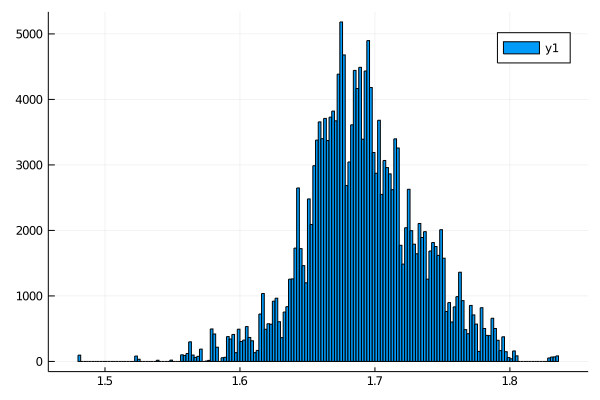

In [6]:
#scatter(rhos, vps, vpvs)
histogram(vpvs)

In [7]:
elts = Set()
for modes in all_modes
    push!(elts, modes["elements"]...)
end
nlayers = length(all_modes[1]["T(K)"])-1
elt_vals = Dict()
for elt in elts
    elt_vals[elt] = fill(-1.0, nlayers)
    for i in 1:(nlayers)
        vals = [elt in keys(all_modes[j]) ? all_modes[j][elt][i] : 0.0 for j in 1:length(all_modes)]
        vals = [isnan(v) ? 0.0 : v for v in vals]
        elt_vals[elt][i] = mean(vals)
    end
    
end

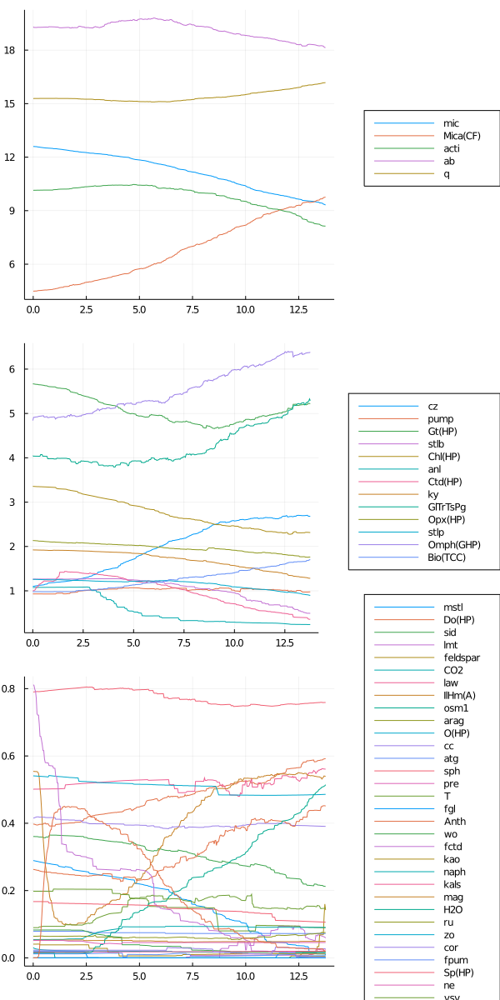

In [8]:
depth = elt_vals["P(bar)"] ./ dpdz

p = plot(legend=:outerright)
for elt in elts
    if (elt != "T(K)") & (elt != "P(bar)") & (maximum(elt_vals[elt]) > 8)
        plot!(p, depth, elt_vals[elt], label=elt)
    end
end

p2 = plot(legend=:outerright)
for elt in elts
    if (elt != "T(K)") & (elt != "P(bar)") & (maximum(elt_vals[elt]) < 8) & (maximum(elt_vals[elt]) > 1)
        plot!(p2, depth, elt_vals[elt], label=elt)
    end
end

p3 = plot(legend=:outerright)
for elt in elts
    if (elt != "T(K)") & (elt != "P(bar)") & (maximum(elt_vals[elt]) < 1) 
        plot!(p3, depth, elt_vals[elt], label=elt)
    end
end

plot(p, p2, p3, layout=(3,1), size=(600, 400*3))

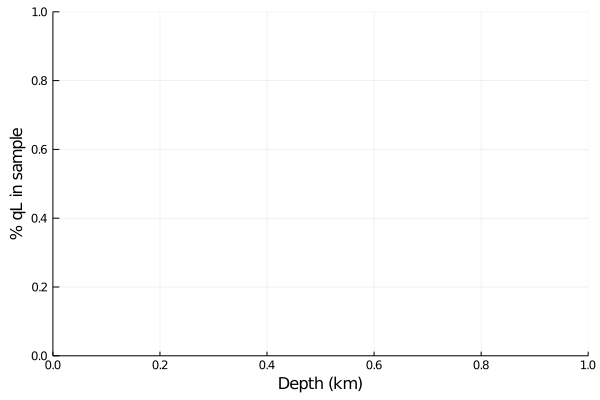

In [9]:
p = plot(legend=false, xlabel="Depth (km)", ylabel="% qL in sample")
for s in all_modes
    if !("qL" in keys(s))
        continue
    end
    plot!(p, s["P(bar)"]./dpdz, s["qL"], alpha=.2)
end 
display(p)

In [10]:
means = Array{Number, 2}(undef, (length(all_seismic), length(keys(all_seismic[1]))-1))
for (i, s) in enumerate(all_seismic)
    s2 = unelementify(s)
    means[i, :] = mean(s2[2:end, :], dims=1)
end 

In [11]:
function zeromean(a)
    vals = [isnan(elt) ? 0.0 : elt for elt in a]
    return mean(vals)
end

threshold = .055

head = all_modes[means[:,end] .> 1.825]
tail = all_modes[means[:,end] .<= 1.825]
h_elts = Dict()
t_elts = Dict()
for elt in elts 
    if (elt == "T(K)" ) | (elt == "P(bar)")
        continue 
    end
    h_vals = [elt in keys(h) ? zeromean(h[elt]) : 0.0 for h in head]
    t_vals = [elt in keys(t) ? zeromean(t[elt]) : 0.0 for t in tail]
    if mean(h_vals) > threshold
    h_elts[elt] = mean(h_vals)
    t_elts[elt] = mean(t_vals)
end 


LoadError: syntax: incomplete: "for" at none:1 requires end

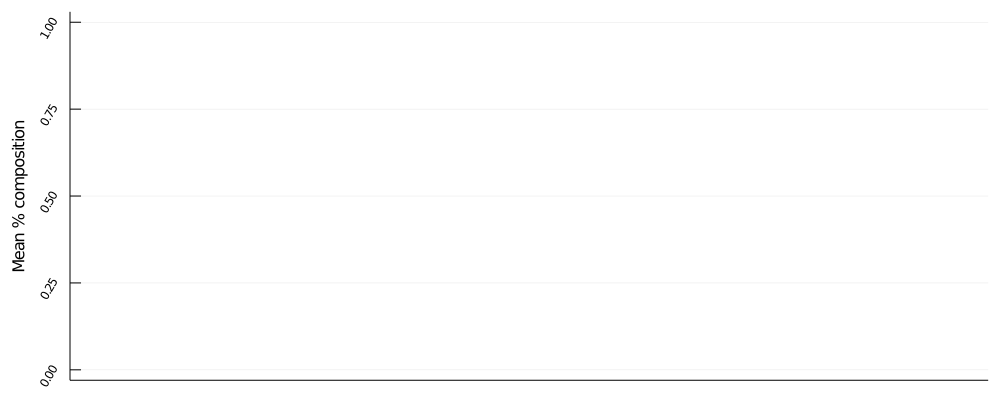

In [12]:
bar([h_elts[k] for k in keys(h_elts)], xticks=(1:length(keys(h_elts)), keys(h_elts)), 
    rotation=60, size=(1000, 400), legend=false, ylabel="Mean % composition")

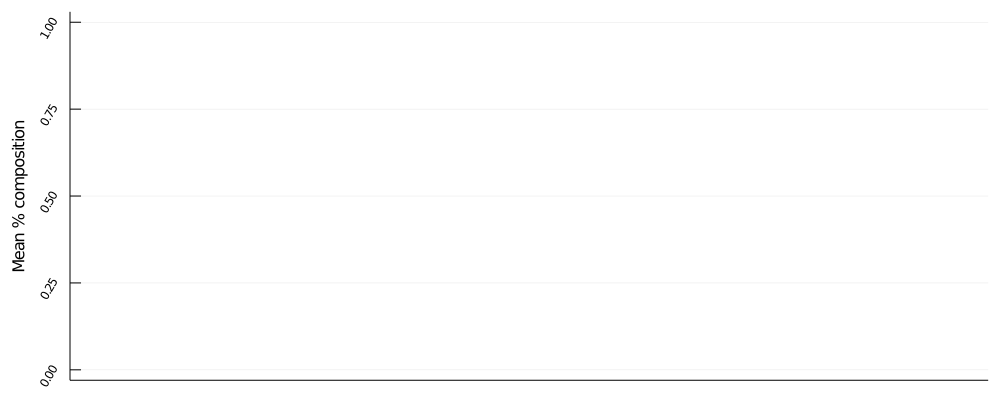

In [13]:
bar([t_elts[k] for k in keys(t_elts)], xticks=(1:length(keys(t_elts)), keys(t_elts)), 
    rotation=60, size=(1000, 400), legend=false, ylabel="Mean % composition")

In [14]:
header = ["P(bar)", "T(K)",    "rho,kg/m3",  "vp,km/s",  "vp/vs"]
header = header[header .!= "elements"]
push!(header, elts...)
println(header)
all_means = means
for elt in elts 
    m = [elt in s["elements"] ? zeromean(s[elt]) : 0.0 for s in all_modes]
    all_means = hcat(all_means, m)
end
all_means = vcat(reshape(header, (1, length(header))), all_means)
all_means
writedlm("../output/sample_upper_crust_modes.csv", all_means, ',')

["P(bar)", "T(K)", "rho,kg/m3", "vp,km/s", "vp/vs", "T(K)", "cz", "pump", "Gt(HP)", "mstl", "stlb", "Do(HP)", "Chl(HP)", "sid", "lmt", "anl", "mic", "feldspar", "CO2", "law", "IlHm(A)", "osm1", "arag", "Ctd(HP)", "O(HP)", "cc", "atg", "sph", "ky", "GlTrTsPg", "pre", "T", "fgl", "Anth", "wo", "fctd", "kao", "Opx(HP)", "naph", "kals", "mag", "H2O", "stlp", "Omph(GHP)", "ru", "zo", "Mica(CF)", "acti", "cor", "P(bar)", "ab", "q", "fpum", "Sp(HP)", "Bio(TCC)", "ne", "vsv", "na2o", "ilm_nol"]


In [15]:
all_means[1:3,1:5]

3×5 Array{Any,2}:
     "P(bar)"     "T(K)"      "rho,kg/m3"   "vp,km/s"     "vp/vs"
 2298.5        358.722    2598.76          3.18997     NaN       
 1808.5        383.089    3026.5           6.61322       1.69293 

In [16]:
all_seismic[1]["P(bar)"]

393-element Array{Float64,1}:
    1.0   
   12.7219
   24.4439
   36.1658
   47.8878
   59.6097
   71.3316
   83.0536
   94.7755
  106.497 
  118.219 
  129.941 
  141.663 
    ⋮     
 4467.06  
 4478.78  
 4490.5   
 4502.22  
 4513.95  
 4525.67  
 4537.39  
 4549.11  
 4560.83  
 4572.56  
 4584.28  
 4596.0   